#### Fractional Laplace implementation

Evaluating the discrete fractional Laplacian

\begin{align*}
        (- \Delta_h)^{\frac{\alpha}{2}} u_j = \frac{1}{h^\alpha} \sum_{m \neq j} (u_j - u_m) K^{\alpha}(j-m),
\end{align*}
where the discrete kernel $K_\alpha$ is defined as 

\begin{equation}    K_\alpha(j) = \frac{2^\alpha \Gamma(\frac{1+\alpha}{2}) \Gamma(|j| - \frac{\alpha}{2})}{ |\Gamma(-\frac{\alpha}{2})| \Gamma(|j| + 1 + \frac{\alpha}{2})}.
\end{equation}

In [2]:
using SpecialFunctions: gamma, loggamma, zeta

function gett(array::Vector{Float64}, index::Int, uBC::Float64) # get_index of array with fixed boundary values.
    # Check if the index is within the bounds of the array
    if index >= 1 && index <= length(array)
        return array[index]  # Return the item at the specified index
    else
        return uBC
    end
end

function fractional_Laplacian_vec(u_vec, α, h, R, uBC)
    fracLap = zeros(Float64, length(u_vec))
    c_α = 2^α * gamma((1+ α)/2) / ( abs(gamma(-α/2)) * sqrt(π))
    K_α_vec = [exp( loggamma( abs(m) - α/2)  - loggamma( (abs(m) + 1 + α/2) )  ) for m in 1:R]
    F_2_factor= c_α/(h^α)*2*( zeta(1+α) - sum([1/m^(1 + α) for m in 1:(R-1)]) )
    for j in eachindex(u_vec)
        fracLap[j] = fractional_Laplacian(u_vec, j, α,  c_α, h, R, K_α_vec, uBC, F_2_factor)
    end
    return fracLap
end

function fractional_Laplacian(u_vec, j, α, c_α, h, R, K_α_vec, uBC, F_2_factor)
    summ = 0
    for m in 1:R
        summ += (2*u_vec[j] - gett(u_vec, j+m, uBC) - gett(u_vec, j-m, uBC))*K_α_vec[m]
    end
    return c_α/(h^α) * summ + F_2_factor*u_vec[j]
end


function fractional_Laplacian_vec_no_RZ(u_vec, α, h, R, R2, uBC)
    fracLap = zeros(Float64, length(u_vec))
    c_α = 2^α * gamma((1+ α)/2) / ( abs(gamma(-α/2)) * sqrt(π))
    K_α_vec = [exp( loggamma( abs(m) - α/2)  - loggamma( (abs(m) + 1 + α/2) )  ) for m in 1:R]
    F_2_factor= c_α/(h^α)*2*(sum([1/m^(1 + α) for m in (R+1):R2]) )
    for j in eachindex(u_vec)
        fracLap[j] = fractional_Laplacian(u_vec, j, α,  c_α, h, R, K_α_vec, uBC, F_2_factor)
    end
    return fracLap
end

function ∇²(f, h)
    ∇²f = Array{Float64}(undef, length(f)) # initialize to zero since we don't touch the boundaries
    for x = 2:length(f)-1 # compute ∇²f in interior of f
        ∇²f[x] = (f[x+1] - 2f[x] + f[x-1])/h^2
    end
    ∇²f[1] = 0; ∇²f[end] = 0;
    return ∇²f
 end

∇² (generic function with 1 method)

### Plotting the comparison of analytical and approximated ($F_1 + F_2$) fractional Laplacian

h: 0.2000200020002012
mΔ_u[length(mΔ_u)/2]: -0.5165584830452571


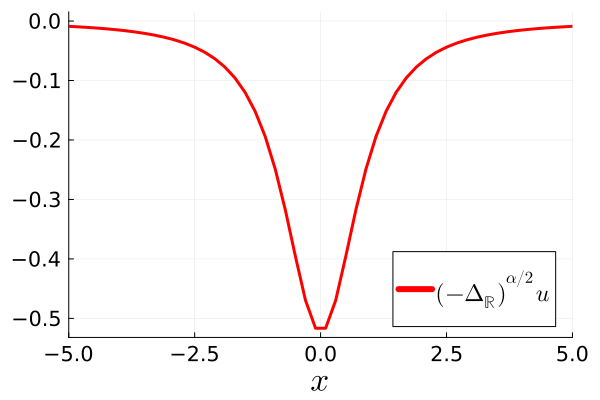

In [3]:
using LaTeXStrings
using Plots;
α = 1.5
s = α/2
x = range(-1000, 1000, length = 10000)
h = x[2] - x[1]
println("h: ", h)
u_test_func(x) = (1 + x^2)^(-(1/2 - s))
u_test = u_test_func.(x)

mΔ_u = (x -> 4^s * (gamma(1/2 + s) / gamma(1/2 - s)) * (1 + x^2)^(-(1/2 + s))).(x)
println("mΔ_u[length(mΔ_u)/2]: ", mΔ_u[Int(length(mΔ_u)/2)])
plot(x, mΔ_u, color=:red, label =L"(-\Delta_\mathbb{R})^{α / 2} u", xlabel=L"x", tickfontsize=14, xlim=(-5,5), xguidefontsize = 22, legendfontsize=16, lw=3, right_margin = 5Plots.mm) # 

#mΔ_hu_disc3 = fractional_Laplacian_vec(u_test, α, h, 10000, u_test[1])
#plot!(x, mΔ_hu_disc3, st = :scatter, markershape=:xcross, markerstrokewidth=3, markersize=4.2, color= :blue, label = L"(-\Delta_{ℝ, h})^{α/2} u")
#savefig("figures/pdl_verification_alpha0.5_h0.2.pdf")

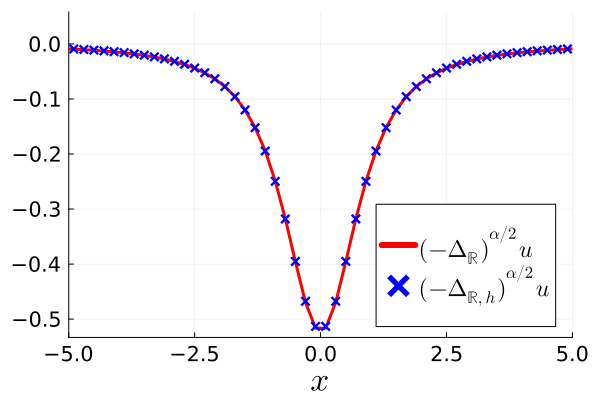

In [4]:
using LaTeXStrings
using Plots;
α = 1.5
s = α/2
x = range(-1000, 1000, length = 10000)
h = x[2] - x[1]
u_test_func(x) = (1 + x^2)^(-(1/2 - s))
u_test = u_test_func.(x) 

mΔ_u = (x -> 4^s * gamma(1/2 + s) / gamma(1/2 - s) * (1 + x^2)^(-(1/2 + s))).(x)
plot(x, mΔ_u, color=:red, label =L"(-\Delta_\mathbb{R})^{α / 2} u", xlabel=L"x", tickfontsize=14, xlim=(-5,5), xguidefontsize = 22, legendfontsize=16, lw=3, right_margin = 5Plots.mm)

mΔ_hu_disc3 = fractional_Laplacian_vec(u_test, α, h, 10000, u_test[1])
plot!(x, mΔ_hu_disc3, st = :scatter,  markershape=:xcross, markerstrokewidth=3, markersize=4.2, color= :blue, label = L"(-\Delta_{ℝ, h})^{α/2} u")
#savefig("figures/pdl_verification_alpha1.5_h0.2.pdf")

#### Sanity check against $\alpha \to 2$

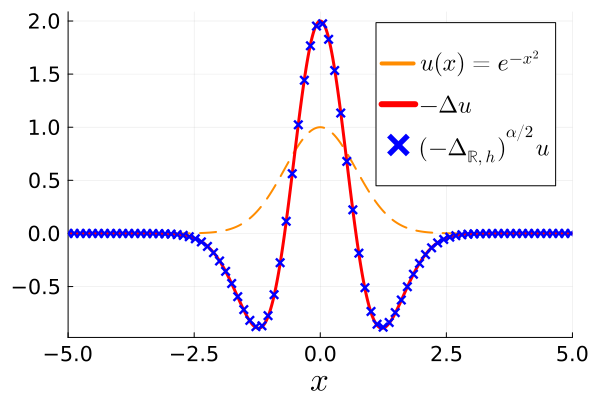

In [ ]:
using LaTeXStrings
using Plots;
α = 1.99
s = α/2
x = range(-5, 5, length = 1000)
h = x[2] - x[1]
u_test_func(x) = exp(-x^2)
u_test = u_test_func.(x)

mΔ_hu_disc = fractional_Laplacian_vec(u_test, α, h, 100000, u_test[1])
mΔ_hu_disc_noRZ = fractional_Laplacian_vec_no_RZ(u_test, α, h, 10000, 10^8, u_test[1]);
d2u =  ∇²(u_test, h)

plot(x, u_test, label =L"u(x) = e^{-x^2}", xlim=(-5,5), lw=2, color=:darkorange, ls=:dash) # 
plot!(x, -d2u, color= :red, label = L"-\Delta u", lw=3)
plot!(x[1:12:end], mΔ_hu_disc[1:12:end], st = :scatter, color=:blue,  label = L"(-\Delta_{\mathbb{R}, h})^{α/2} u", markershape=:xcross, legendfontsize=16, markerstrokewidth=3, markersize=4.2, xlabel=L"x", xguidefontsize = 22, tickfontsize=14, xlim=(-5,5), lw=3, right_margin = 5Plots.mm)
#plot!(x[1:12:end], mΔ_hu_disc_noRZ[1:12:end], st = :scatter,    markershape=:xcross, markerstrokewidth=3, markersize=4.2, color= :blue, label = L"(-\Delta_{\mathbb{R}, h})^{α/2}_{\neg \zeta} u", xlabel=L"x", ma=1)
#savefig("figures/pdl_zeta_trick_alpha_tendsto_2_big_legend.pdf");

#### Comparing to truncated PDL
Fix a truncation radius $R_2 \gg R \gg 1$. Then, we let 
\begin{align*}
        (- \Delta_h)^{\frac{\alpha}{2}} u_j = \frac{1}{h^\alpha} \sum_{m = -R, \\ m \neq 0}^{R} (u_j - u_{j+m}) K_{\alpha}(m) + \frac{1}{h^\alpha} \sum_{R_2>|m|>R } u_j K_{\alpha}(m)
\end{align*}

#### Sanity check against $\alpha \to 0$

In [ ]:
using LaTeXStrings
using Plots;
#α_vec = 0.02:0.02:2
#α_vec = [0.025, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0]
α_vec = 0.02:0.02:0.5
R = 10^4
R2 = 10^8
s1_vec = Array{Float64}(undef, length(α_vec))
s2_vec = Array{Float64}(undef, length(α_vec))
for i in eachindex(α_vec)
    α = α_vec[i]
    s1_vec[i] = sum([1/m^(1 + α) for m in R:R2])
    s2_vec[i] = zeta(1+α) - sum([1/m^(1 + α) for m in 1:(R-1)])
end

plot(α_vec, st=:scatter, abs.(s1_vec - s2_vec), xlabel=L"\alpha", color="#FE0000", xlim=(0,0.52), legend=false, markersize=5, tickfontsize=14, labelfontsize=22)
#savefig("figures/PDL_zeta_trick_sum_comp_fewer_points_no_legend.pdf");

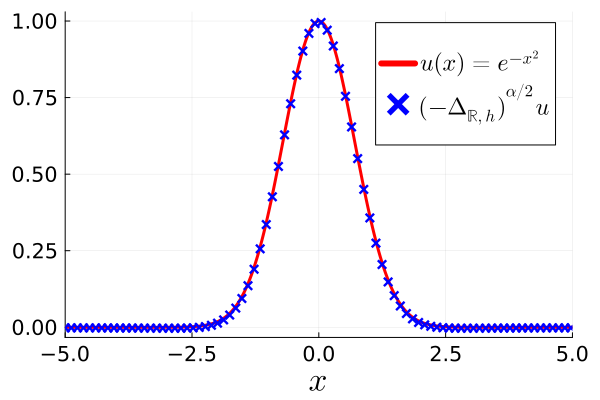

In [19]:
using LaTeXStrings
using Plots;
α = 0.01
s = α/2
x = range(-5, 5, length = 1000)
h = x[2] - x[1]
u_test_func(x) = exp(-x^2)
u_test = u_test_func.(x)



mΔ_hu_disc = fractional_Laplacian_vec(u_test, α, h, 10000, u_test[1]);
mΔ_hu_disc_noRZ = fractional_Laplacian_vec_no_RZ(u_test, α, h, 10000, 10^8, u_test[1]);
# mΔ_hu_cont = mΔ_σ_function(m_0_func, x, h, α, 10000)

plot(x, u_test, color=:red, label =L"u(x) = e^{-x^2}", xlim=(-5, 5), legendfontsize=14, lw=3) # 
plot!(x[1:12:end], mΔ_hu_disc[1:12:end], st = :scatter, color=:blue,  label = L"(-\Delta_{\mathbb{R}, h})^{α/2} u", markershape=:xcross, legendfontsize=16, markerstrokewidth=3, markersize=4.2, xlabel=L"x", xguidefontsize = 22, tickfontsize=14, xlim=(-5,5), lw=3, right_margin = 5Plots.mm)
#plot!(x, mΔ_hu_disc_noRZ, label = L"(-\Delta_h)^{α/2}_{\neg \zeta} u", xlabel=L"x", st = :scatter, lw=4, markerstrokecolor=:purple, color=:purple)

#savefig("figures/pdl_zeta_trick_alpha_tendsto_0_big_legend.pdf");

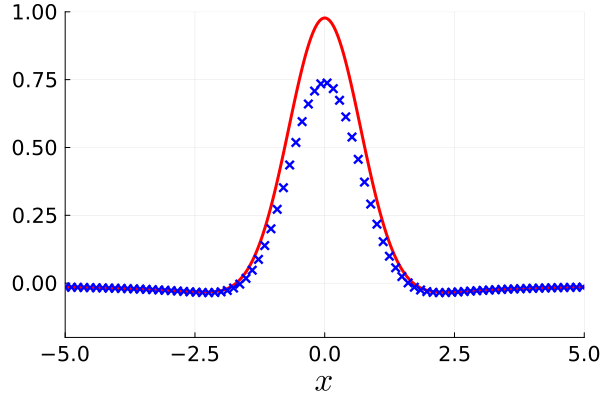

In [31]:
using LaTeXStrings
using Plots;
#α=0.5
#α=0.2
 α=0.1
x = range(-5, 5, length = 1000)
h = x[2] - x[1]
u_test_func(x) = exp(-x^2)
u_test = u_test_func.(x)

# size=(500,300)

mΔ_hu_disc = fractional_Laplacian_vec(u_test, α, h, 10000, u_test[1]);
mΔ_hu_disc_noRZ = fractional_Laplacian_vec_no_RZ(u_test, α, h, 10000, 10^8, u_test[1]);

plot(x, mΔ_hu_disc, ylim=(-0.2,1), xlim=(-5, 5), color=:red, legend=false, lw=3, labelfontsize=20, tickfontsize=12) # 
plot!(x[1:12:end], mΔ_hu_disc_noRZ[1:12:end], st = :scatter, color=:blue,  markershape=:xcross, markerstrokewidth=3, markersize=4.2, xlabel=L"x", xguidefontsize = 22, tickfontsize=14, xlim=(-5,5), lw=3, right_margin = 2Plots.mm)


#savefig("figures/pdl_zeta_trick_alpha_0.1_no_legend.pdf");

----------------

### Convergence to fractional Laplacian

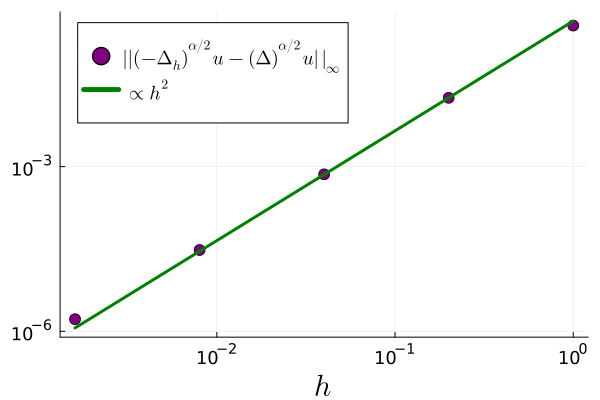

In [56]:
using LaTeXStrings
using Plots;
using Interpolations;

α = 1.5
s = α/2
u_test_func(x) = exp(-x^2)

#bencmark sizes
h_good = 0.001
x_good = -5:h_good:5
u_good = u_test_func.(x_good)
fL_good = fractional_Laplacian_vec(u_good, α, h_good, 10000, u_good[1]);

#error checking
h_vec = [5.0^i for i in 0:-1:-4]
errs = Array{Float64}(undef, length(h_vec))
for i in eachindex(h_vec)
    h_bad = h_vec[i]
    x_bad = -5:h_bad:5
    u_bad = u_test_func.(x_bad)
    fL_bad = fractional_Laplacian_vec(u_bad, α, h_bad, 10000, u_bad[1]);
    fL_good_interp = linear_interpolation(x_good, fL_good).(x_bad)
    errs[i] = maximum(abs.(fL_bad .- fL_good_interp))
end


plot(h_vec, errs, st = :scatter, markersize=6, color=:purple, xaxis = :log, yaxis = :log, xlabel = L"h", 
label =L"|| (-\Delta_h)^{\alpha/2} u - (\Delta)^{\alpha/2} u||_{\infty}", legend=:topleft, legendfontsize=13, labelfontsize=20, tickfontsize=12)
plot!(h_vec, 0.45*h_vec.^2, color = :green,  xaxis = :log, yaxis = :log, xlabel = L" h", label =L"\propto h^2", lw=3)

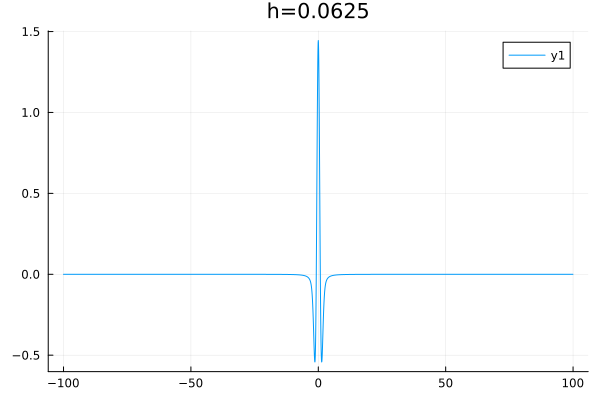

i, h: 1 0.0625
i, h: 2 0.03125
i, h: 3 0.015625
i, h: 4 0.0078125
i, h: 5 0.00390625
i, h: 6 0.000244140625
h_list: [0.0625, 0.03125, 0.015625, 0.0078125, 0.00390625, 0.000244140625]

h: 0.0625
i: 1. Restriction_step: 256
size(full_U_list[i]): (3200,)
maximum(abs.(wrt_vec): 1.4464091072033076
max_index_diff: 17. Total length: 32. x-pos: 0.53125
max_index_wrt_vec: 17. Total length: 32. x-pos: 0.53125

h: 0.03125
i: 2. Restriction_step: 128
size(full_U_list[i]): (6400,)
maximum(abs.(wrt_vec): 1.4464091072033076
max_index_diff: 33. Total length: 64. x-pos: 0.515625
max_index_wrt_vec: 33. Total length: 64. x-pos: 0.515625

h: 0.015625
i: 3. Restriction_step: 64
size(full_U_list[i]): (12800,)
maximum(abs.(wrt_vec): 1.4464091072033076
max_index_diff: 65. Total length: 128. x-pos: 0.5078125
max_index_wrt_vec: 65. Total length: 128. x-pos: 0.5078125

h: 0.0078125
i: 4. Restriction_step: 32
size(full_U_list[i]): (25600,)
maximum(abs.(wrt_vec): 1.4464091072033076
max_index_diff: 129. Total lengt

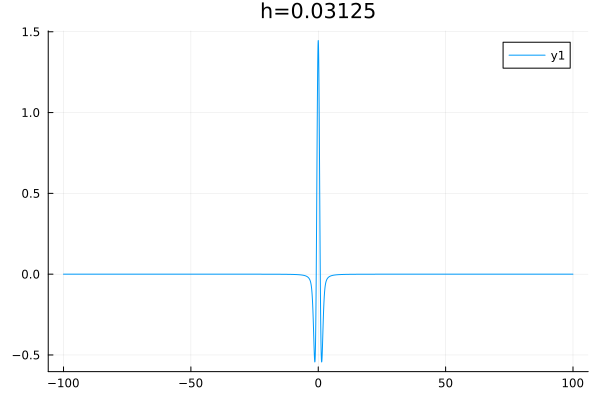

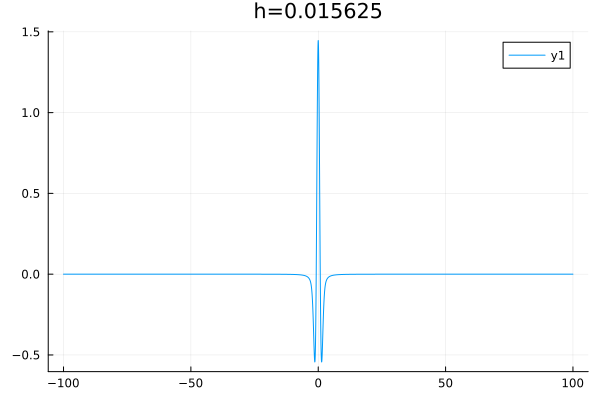

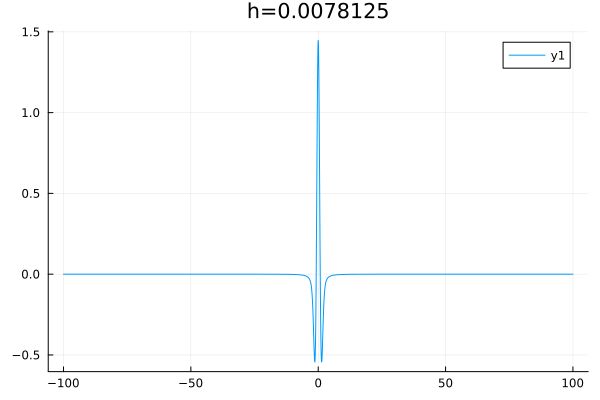

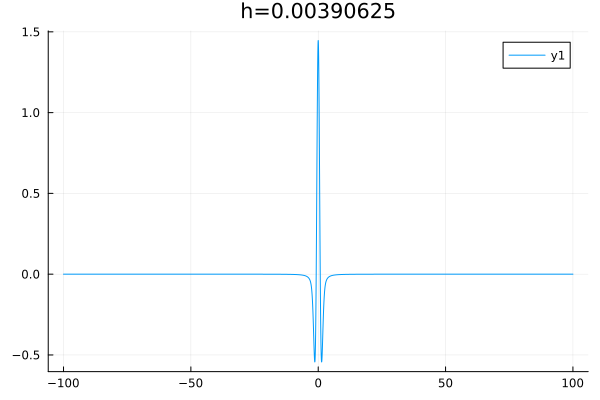

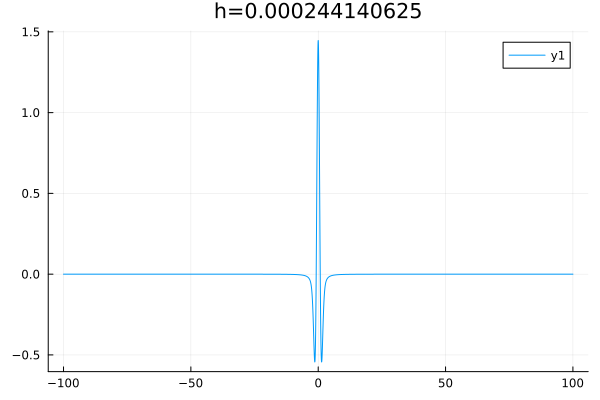

(Any[0.0012197357977255208, 0.00030512989951945075, 7.630564070324271e-5, 1.9088661944093178e-5, 4.78342701559723e-6], Any[1.9990732241206266, 1.9995619420472228, 1.9990737307716893, 1.996599486554426])

In [5]:
using LaTeXStrings
using Plots;
using Interpolations;


α = 1.5
s = α/2
u_test_func(x) = exp(-x^2)


function relative_max_error(vec, wrt_vec, debug=false)
    max_difference = maximum(abs.(vec-wrt_vec))
    max_rel_error = max_difference/maximum(abs.(wrt_vec))
    max_index_diff = argmax(abs.(vec-wrt_vec))
    max_index_wrt_vec = argmax(abs.(wrt_vec))
    if debug
        println("maximum(abs.(wrt_vec): ", maximum(abs.(wrt_vec)))
        println("max_index_diff: ", max_index_diff, ". Total length: ", length(vec), ". x-pos: ", string((max_index_diff/length(vec))) )
        println("max_index_wrt_vec: ", max_index_wrt_vec, ". Total length: ", length(vec), ". x-pos: ", string((max_index_wrt_vec/length(vec))))
    end
    return max_rel_error
end


h_ref = 2^(-12)
h_list = [1/2^4, 1/2^5, 1/2^6, 1/2^7, 1/2^8, h_ref]

x_l = -100
x_r= 100

fL_list = []
for (i,h) in enumerate(h_list)
    println("i, h: ", i, " ", h)
    x_vec = x_l:h:x_r-h
    u_vec = u_test_func.(x_vec)
    fL_vec = fractional_Laplacian_vec(u_vec, α, h, 100000, u_vec[1])
    push!(fL_list, fL_vec)    
    
    #p = plot(x_vec[-5 .<= x_vec .< 5], fL_vec[-5 .<= x_vec .< 5], title="h="*string(h))
    p = plot(x_vec, fL_vec, title="h="*string(h))
    display(p)    
end
println("h_list: ", h_list)


function ref_sol_convergence_rate(full_h_list, full_U_list, x_l, x_r)
    rel_err_U_list = []
    for i in 1:length(full_h_list)-1
        println("")
        println("h: ", full_h_list[i])
        h_i = full_h_list[i]
        h_finest = full_h_list[end]

        x_coarse = x_l:h_i:(x_r-h_i)
        x_fine   = x_l:h_finest:(x_r-h_finest) 
        restriction_step = Int(2^(-(log2(h_finest)-log2(h_i)))) #Assume we are halving each time. Int(2^(-(log2(h_finest)-log2(h_i))))
        println("i: ", i, ". Restriction_step: ", restriction_step)
        println("size(full_U_list[i]): ", size(full_U_list[i]))
        U_i = full_U_list[i][-1 .<= x_coarse .< 1] #x ∈ [0,1), at time t=0.
        U_finest = full_U_list[end][-1 .<= x_fine .< 1]
        U_finest_restricted = U_finest[begin:restriction_step:end]
        U_i_rel_err = relative_max_error(U_i, U_finest_restricted, true)
        push!(rel_err_U_list, U_i_rel_err)

    end

    conv_rate_U_list = []

    for j in 1:length(rel_err_U_list[1:end-1])
        U_rate = log(rel_err_U_list[j]/rel_err_U_list[j+1])/(log(full_h_list[j]/full_h_list[j+1]))
        push!(conv_rate_U_list, U_rate)

    end

    #return full_h_list, full_U_list, full_M_list, (α, x_l, x_r, t_0, T, ν, δ)
    return rel_err_U_list, conv_rate_U_list
end

rel_err_fL, conv_rate_fL = ref_sol_convergence_rate(h_list, fL_list, x_l, x_r)

In [6]:
println("rel_err_fL: ", rel_err_fL)
println("conv_rate_fL: ", conv_rate_fL)

rel_err_fL: Any[0.0012197357977255208, 0.00030512989951945075, 7.630564070324271e-5, 1.9088661944093178e-5, 4.78342701559723e-6]
conv_rate_fL: Any[1.9990732241206266, 1.9995619420472228, 1.9990737307716893, 1.996599486554426]


In [8]:
#PRINT U AND M CONVERGENCE FOR LATEX
ref_sol_rel_err_U_list = rel_err_fL
ref_sol_conv_rate_U_list = conv_rate_fL
full_h_list = h_list

using Printf
# Print LaTeX table header
println("\\begin{tabular}{|c|c|c|}")
println("\\hline")
println("\$h\$ & U rel. \$L^{\\infty}\$ error  & U rate \\\\")
println("\\hline")

# Print the rows of the table
for i in 1:length(full_h_list)-1
    U_re_s_num = @sprintf "%.2e" ref_sol_rel_err_U_list[i]    

    if i==1
        U_ra_s_num = "--"
        println("\$2^{",string(Int(log2(full_h_list[i])),"}\$", " & ", "\$",U_re_s_num,"\$"," & ", "\$",U_ra_s_num,"\$",  " \\\\"))
        println("\\hline")
    else
        U_ra_s_num = @sprintf "%.3f" ref_sol_conv_rate_U_list[i-1]
    
        println("\$2^{",string(Int(log2(full_h_list[i])),"}\$", " & ", "\$",U_re_s_num,"\$"," & ", "\$",U_ra_s_num,"\$", " \\\\"))
        println("\\hline")
    end
end

# Print LaTeX table footer
println("\\end{tabular}")

\begin{tabular}{|c|c|c|}
\hline
$h$ & U rel. $L^{\infty}$ error  & U rate \\
\hline
$2^{-4}$ & $1.22e-03$ & $--$ \\
\hline
$2^{-5}$ & $3.05e-04$ & $1.999$ \\
\hline
$2^{-6}$ & $7.63e-05$ & $2.000$ \\
\hline
$2^{-7}$ & $1.91e-05$ & $1.999$ \\
\hline
$2^{-8}$ & $4.78e-06$ & $1.997$ \\
\hline
\end{tabular}


### Comparing verified implementation on real line with periodic DPL matrix

In [9]:
using SpecialFunctions: gamma, loggamma, zeta
function TS(m, α, N_h, R)
    if m==0
        return 0
    end
    K_α = 0.0
    for ν in -R:1:R
        K_α += exp( loggamma( abs(m - N_h*ν) - α/2 )  - loggamma( ( abs(m - N_h*ν) + 1 + α/2) )  )
    end
    return K_α
end
    

function create_DPL_matrix(N_h, α, h, R)
    DPL_mat = Matrix{Float64}(undef, N_h, N_h)
    zeta_term= zeta(1+α)
    for i in 1:N_h
        for j in 1:N_h
            DPL_mat[i,j] = TS(abs(i-j), α, N_h, R)
        end
    end
    for γ in 1:N_h
        DPL_mat[γ, γ] = -(sum([TS(β-γ, α, N_h, R) for β in 1:N_h]) + 2*zeta_term - 
        sum([1/k^(1+α) for k in 1:((R+1)*N_h - γ) ]) - sum([1/k^(1+α) for k in 1:(R*N_h + γ - 1) ]))
    end
    c_α = 2^α * gamma((1+α)/2) / (√π * abs(gamma(-α/2)) )
    return -c_α / (h^α) * DPL_mat
end


create_DPL_matrix (generic function with 1 method)

In [10]:
function mΔ_σ_function(u_func, x_arr, h, σ, R) # this is a rubbish implementation, without riemann zeta. But works for high alpha.
    Δ_hU = Array{Float64}(undef, length(x_arr))
    cs = 2^(σ) * gamma((1 + σ)/2) / ( h^(σ) * sqrt(π) * abs(gamma(- σ/2))  )
    for j in 1:length(x_arr)
        summ = 0
        for m in 1:R
            summ += (u_func(x_arr[j]) - u_func(x_arr[j] - h*m)) * kappa(h, -m, σ, cs) + (u_func(x_arr[j]) - u_func(x_arr[j] + h*m)) * kappa(h, m, σ, cs)
        end
    Δ_hU[j] = summ
    end
    return Δ_hU #returns vector of same length as vector in.
end

function kappa(h, j, σ, cs) # where gamma_vec is the vector of the two factors which is determined by σ. 
    # Verified is correct based on formula in paper Jakobsen et al. referred to, and agrees with Jakobsen et al.
    factor2 = exp( loggamma( abs(j) - σ/2)  - loggamma( (abs(j) + 1 + σ/2) )  )
    return cs * factor2
end

kappa (generic function with 1 method)

In [11]:
using Plots, LaTeXStrings;
h = 0.005
x = 0:h:(1-h)
α = 1.5
N_h = length(x)
R = 100
f_func(x) = sin(2*pi*x)
f_vec = sin.(2*pi*x)

DPL_matrix = create_DPL_matrix(N_h, α, h, R)
FL_matprod = DPL_matrix * f_vec

fl = mΔ_σ_function(f_func, x, h, α, 100000);

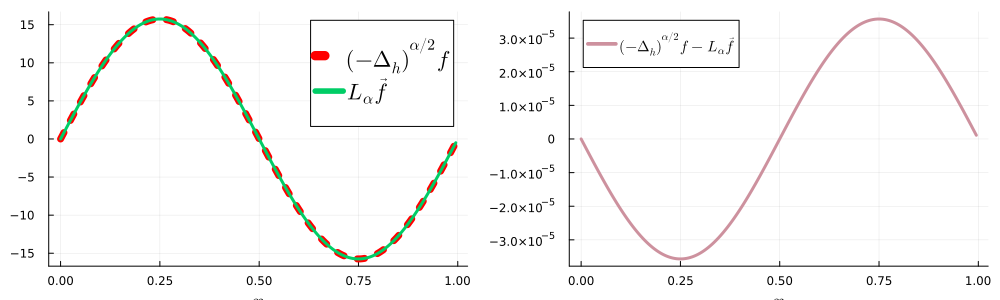

In [12]:
p1 =plot(x, fl, label=L"(-\Delta_h)^{\alpha/2} f", lw=7, color=:red, ls=:dot, legendfontsize=15, legend=:topright, xlabel=L"x", size=(600, 300), labelfontsize=15)
plot!(x, FL_matprod, label=L"L_\alpha \vec f", lw=3, color=:springgreen3)
p2 = plot(x, fl - FL_matprod, label=L"(-\Delta_h)^{\alpha/2} f - L_\alpha \vec f", legendfontsize=10,  xlabel=L"x", lw=3, color=:pink3, size=(400, 200), labelfontsize=15)

plot(p1, p2, layout=2, size=(1000, 300))